# Project 4 - Advanced Lane Finding
## General Project Pipeline
1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


## Camera Calibration
### Camera Calibration Steps
1. Read in calibration chessboard images (at least 20).
2. Map out image points and object points. 
3. Do this for all 20 calibration images and append points to the image and object point array.
4. Calibrate camera (using cv2.calibrateCamera(objpoints, imgpoints, imageshape)).
5. Correct distortion.

In [58]:
#imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import os
import glob
current = os.getcwd()

C:\Users\felix.ding\AppData\Local\Continuum\miniconda3\envs\carnd-term1\lib\site-packages\matplotlib\figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


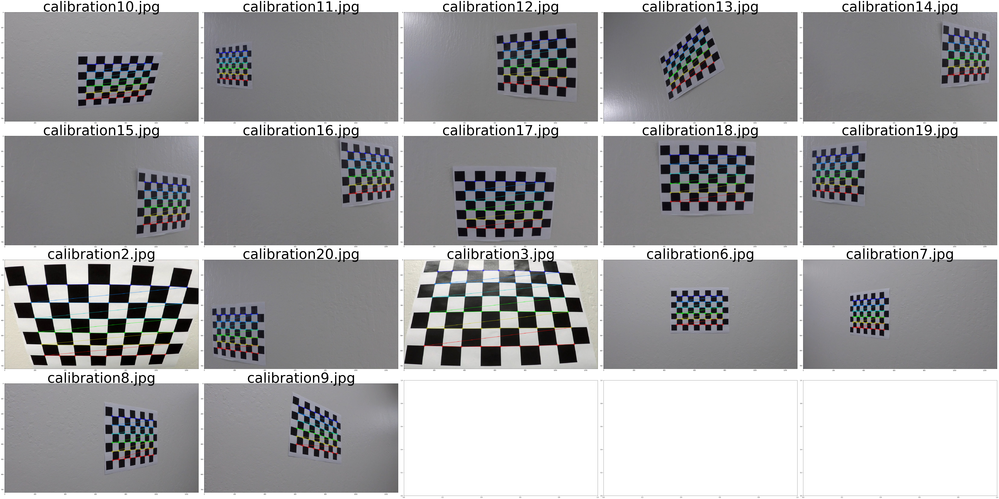

In [113]:
#read in images
images = glob.glob(current + '/camera_cal/calibration*.jpg')

#create img points and obj points
imgpoints = [] #2D points in image plane
objpoints = [] #3D points in real world space
#prepare object points to append
objp = np.zeros((9*6, 3), np.float32) 
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

#for visualization
drawn_images, axes = plt.subplots(len(images)//5, 5, figsize=(100, 50))
i = 0
for fname in images:
    img = mpimg.imread(fname)
    #prepare img points to append
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray,(9,6), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        #draw on corners found
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axes.flat[i].imshow(img)
        axes.flat[i].set_title(fname.split('\\')[-1], fontsize=100)
        i += 1
drawn_images.tight_layout()
drawn_images.show()


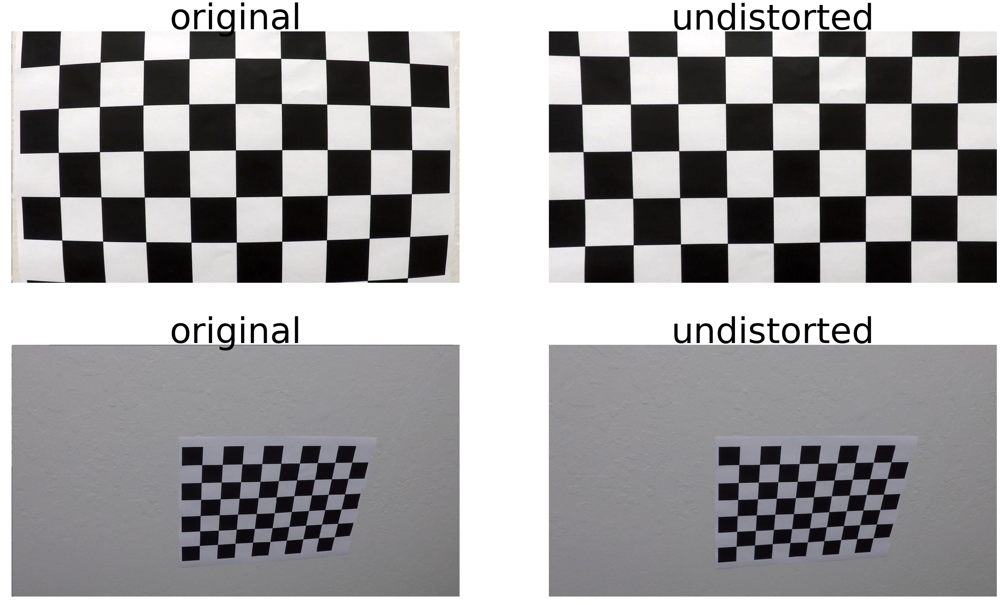

In [122]:
#Calibrate camera. Output can now be used to undistort images
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape, None, None)

#Visualizing undistorted images
show_num = 2
Undist_Comparison, axes = plt.subplots(show_num, 2, figsize=(50,30))

for i in range(show_num):
    img = mpimg.imread(images[i])
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    axes[i,0].imshow(img)
    axes[i,0].set_title('original', fontsize=100)
    axes[i,0].axis('off')
    axes[i,1].imshow(undist)
    axes[i,1].set_title('undistorted', fontsize=100)
    axes[i,1].axis('off')

## Binary Thresholding
### Steps to Binary Thresholding
Primarily, three thresholding will be used. They are:
* absolute gradient thresholding (x or y).
* Gradient magnitude thresholding (by combining x and y).
* Gradient direction thresholding (by calculating the direction of the gradient)

Steps to carry these out are as follows:
1. Create functions for the three thresholding method
2. Combine

In [184]:
#defining three thresholding functions:

def abs_sobel_thresh(img, orient='x', sobel_kernal=3, thresh=(0,255)):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[((scaled_sobel>=thresh[0]) & (scaled_sobel<=thresh[1]))] = 1
    
    return binary_output
    
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    binary_output[((gradmag>=mag_thresh[0]) & (gradmag<=mag_thresh[1]))] = 1
    
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[((absgraddir>=thresh[0]) & (absgraddir<=thresh[1]))] = 1
    
    return binary_output

#a function to combine threshold
def thresh_comb(gradx, grady, mag_binary, dir_binary):
    combined = np.zeros_like(gradx)
    combined[((gradx==1) & (grady==1) & (mag_binary==1) & (dir_binary==1))] = 1
    
    return combined

## Perspective Transform
### Steps to Performing a Perspective Transform
1. Obtain transformation matrix
2. Warp image using said transformation matrix

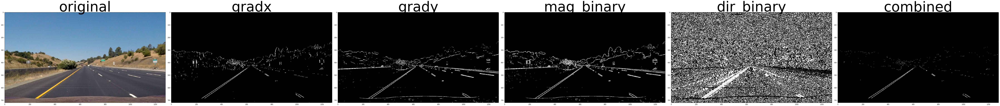

In [199]:
#to perform perspective transform, source and destination points are needed
#as stated by the lesson, for the purpose of the project, the road is assumed to be flat
from collections import OrderedDict
img = mpimg.imread(current + '/test_images/straight_lines1.jpg')
#applying three filters
gradx = abs_sobel_thresh(img, orient='x', sobel_kernal=3, thresh=(50,255))
grady = abs_sobel_thresh(img, orient='y', sobel_kernal=3, thresh=(50,255))
mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(50, 255))
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
combined = thresh_comb(gradx, grady, mag_binary, dir_binary)

#create an ordered dict
thresholds = OrderedDict()
key_list = ['original','gradx','grady','mag_binary','dir_binary','combined']
value_list = [img,gradx,grady,mag_binary,dir_binary,combined]
for i in range(len(key_list)):
    thresholds[key_list[i]] = value_list[i]

#visualizing
fig, ax = plt.subplots(1, len(thresholds), figsize=(100,50))
fig.tight_layout()
i=0 #start counter
for key, value in thresholds.items():
    ax[i].imshow(value, cmap='gray')
    ax[i].set_title(key, fontsize=100)
    i += 1

In [ ]:
#looking for source points


In [ ]:
#the perspective transform shall be done in conjunction with image undistortion, just as shown in the lesson
def coerners_unwarp(img, nx, ny, mtx, dist):
    #start by undistorting the image:
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)

In [196]:
from collections import OrderedDict
thresholds = OrderedDict()
thresholds['one'] = 1
thresholds['one']

1